Notebook created in 2024 with the help of Xiaoyang Wei, Phd student at LIPADE, Université Paris Cité

# Interacting with CLIP

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [ ]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-ebpnsjpz
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-ebpnsjpz
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=488588a28069819ff27bcb198b5d67f9e584a315816519aed1c7adb4ad319369
  Stored in directory: /tmp/pip-ephem-wheel-cache-tbpnspc_/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip


# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [ ]:
import clip
import numpy as np

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [ ]:
model, preprocess = clip.load("ViT-B/16")
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

100%|███████████████████████████████████████| 335M/335M [00:05<00:00, 58.6MiB/s]


Model parameters: 149,620,737
Input resolution: 224
Context length: 77
Vocab size: 49408


# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [ ]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x785d5a32f910>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

# Text Preprocessing

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [ ]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

# Setting up input images and texts

We are going to feed 8 example natrural/medical images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [ ]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


# to mount google drive
if os.getcwd()=='/content':
    try:
        from google.colab import drive
        base_working_dir = '/content/drive/MyDrive'
        drive.mount('/content/drive')
    except:
        base_working_dir = os.getcwd()
        pass
!mkdir -p drive
!google-drive-ocamlfuse drive
print(base_working_dir)

Mounted at /content/drive
/bin/bash: line 1: google-drive-ocamlfuse: command not found
/content/drive/MyDrive


In [ ]:
# images to use and their textual descriptions
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse",
    "coffee": "a cup of coffee on a saucer"
}

med_descriptions = {
    "ROCO_00002": "CT scan in axial view showing obliteration of the left maxillary sinus",
    "ROCO_00017": "Coronary angiogram demonstrating occluded arteries",
    "ROCO_00028": "T2 weighted MRI image showing foraminal extensions of the cysts",
    "ROCO_00033": "Lytic lesions (arrows) involving the humerus.",
    "ROCO_00050": "Free air beneath the diaphragm at abdominal x-ray film",
    "ROCO_00056": "View of giant cell tumor of thumb metacarpal preoperatively",
    "ROCO_00060": "Transverse view of lung using CT.Leukemic infiltration is seen.",
    "ROCO_00135": "CT scan showing multiple non-communicating cysts in liver and kidney"
}

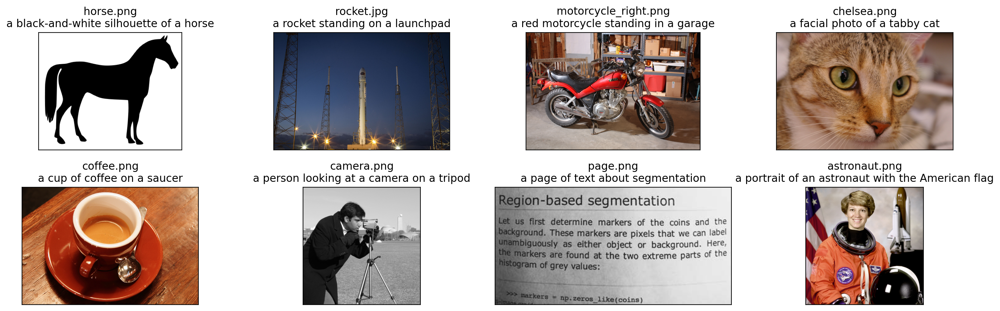

In [ ]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

skimage.data.download_all(directory=None)
for filename in [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")

    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

plt.tight_layout()


## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [ ]:
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

Text(0.5, 1.0, 'Cosine similarity between text and image features(natural)')

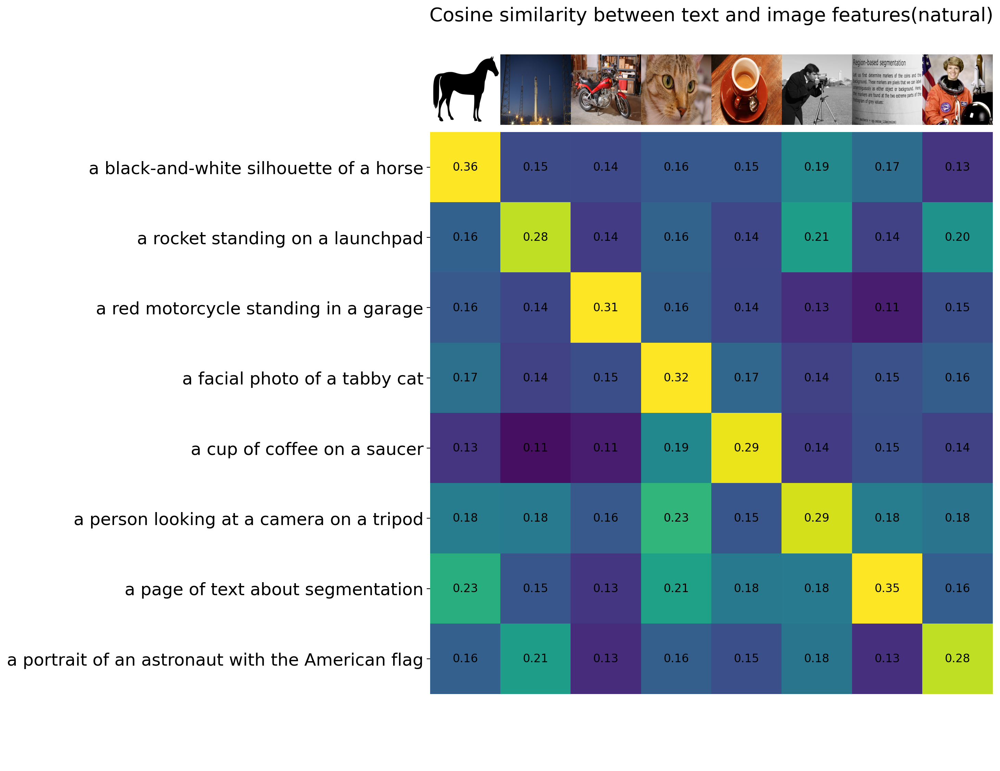

In [ ]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(natural)", size=20)

## Performance of CLIP in medical domain

Text(0.5, 1.0, 'Cosine similarity between text and image features(medical)')

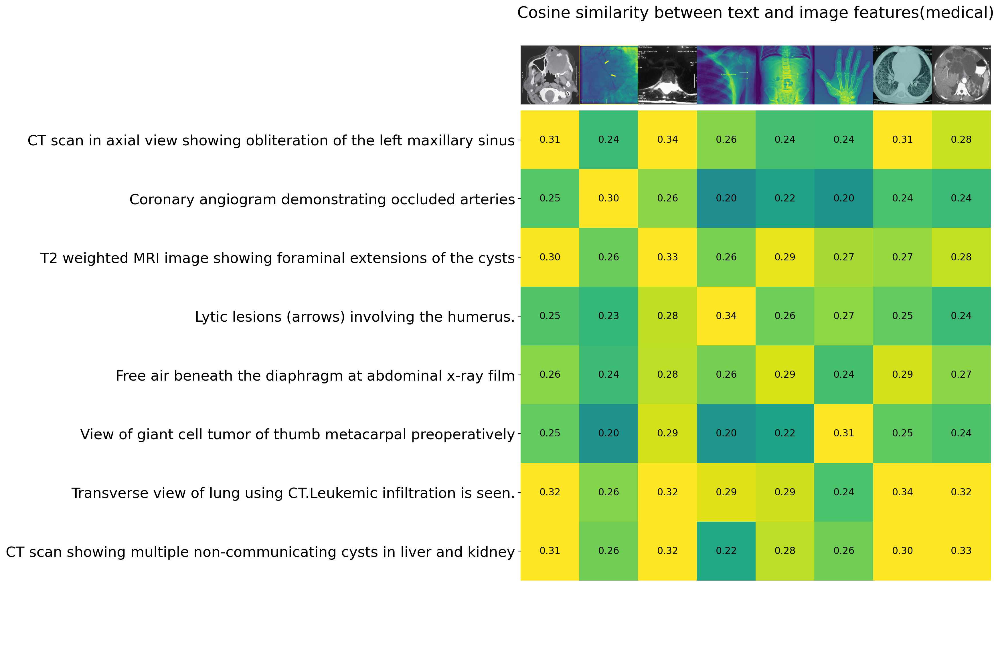

In [ ]:
original_images = []
images = []
texts = []
for filename in list(med_descriptions.keys()):
    image = Image.open(os.path.join("/content/drive/My Drive/data/pretrain_data/roco/train/radiology/images", filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[filename])
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)
for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)


# Zero-Shot Image Classification

You can classify images using the cosine similarity (times 100) as the logits to the softmax operation.

In [ ]:
from torchvision.datasets import CIFAR100

cifar100 = CIFAR100(os.path.expanduser("~/.cache"), transform=preprocess, download=True)

100%|██████████| 169M/169M [00:11<00:00, 14.8MB/s]


Extracting /root/.cache/cifar-100-python.tar.gz to /root/.cache


In [ ]:
text_descriptions = [f"This is a photo of a {label}" for label in cifar100.classes]
text_tokens = clip.tokenize(text_descriptions).cuda()

In [ ]:
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

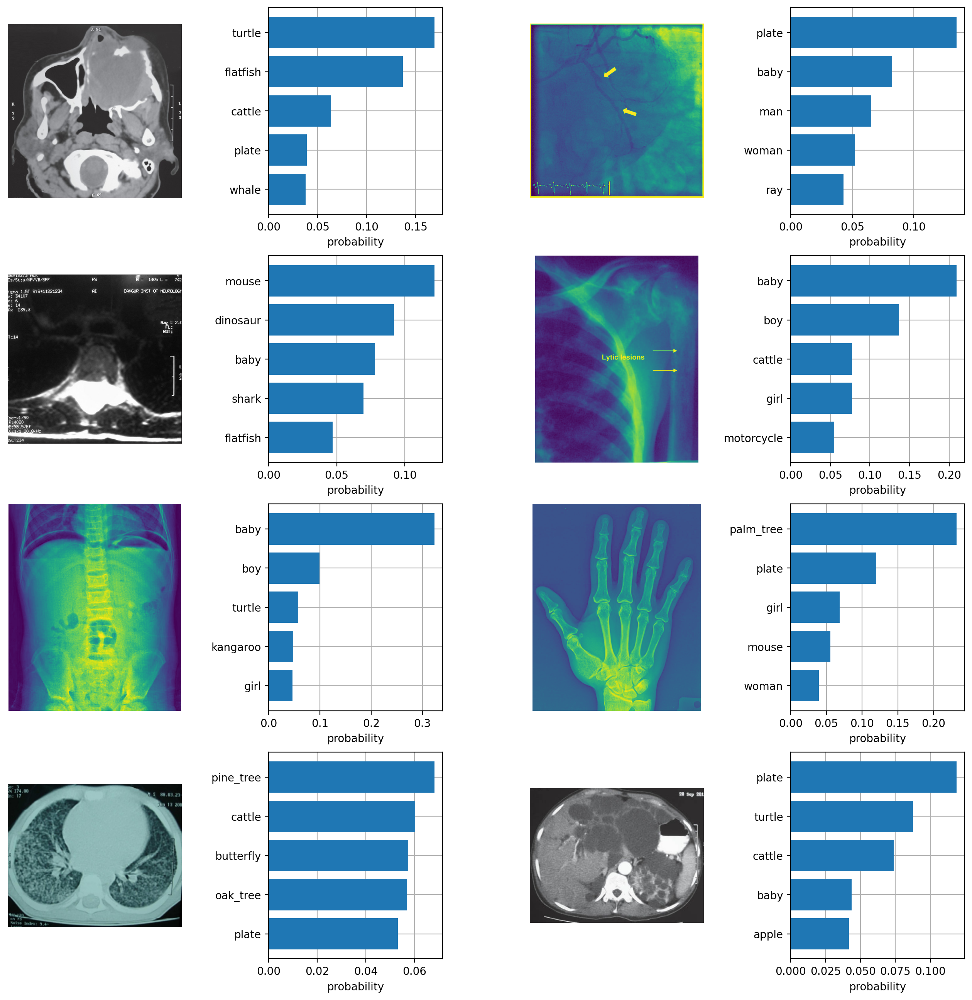

In [ ]:
plt.figure(figsize=(16, 16))

for i, image in enumerate(original_images):
    plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(4, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar100.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()

# Fine-tuning CLIP on ROCO



In [ ]:
# dataset location
csv_file ="/content/drive/My Drive/data/roco-list.csv"
root_dir = "/content/drive/MyDrive/data/pretrain_data/roco/train/radiology/images"
val_csv_file = "/content/drive/My Drive/data/local-val-list.csv"
val_root_dir = "/content/drive/My Drive/data/pretrain_data/roco/val/radiology/images"

# train options
seed = 42
batch_size = 16
image_size = 224
start_epoch = 0
epochs = 10
visual_encoder = "clip@ViT-B/16"
learning_rate = 3e-6
model_path = "/content/drive/My Drive/model_checkpoint_CLIP_ROCO" # set to the directory containing `checkpoint_##.tar`


In [ ]:
import os
import numpy as np
import pandas as pd
import torch
import torchvision
import datetime
import time
from tqdm import tqdm
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from torch.utils.data import Dataset
import random
import clip



class CLRDataset(Dataset):
    """Contrastive Learning Representations Dataset."""

    def __init__(self, csv_file, root_dir, transform=None, clip=False):
        self.clr_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
        self.clip = clip

    def __len__(self):
        return len(self.clr_frame)

    def text_sampling(self, text):
        text = text.replace("\n", " ")
        text = text.split(".")
        if '' in text:
            text.remove('')
        text = random.choice(text)
        return text

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir,
                                self.clr_frame.iloc[idx, 0]
                                )
        if not os.path.exists(img_name):
            img_name=img_name.replace('train','val')
        image = Image.open(img_name)
        if not self.clip:
            image = image.convert('RGB')
        text = self.clr_frame.iloc[idx, 1]
        name = self.clr_frame.iloc[idx, 0]
        sample = {'image': image, 'text': text,'name':name}
        if self.clip:
            sample = self.transform(sample['image']), sample['text'],sample['name'] #self.text_sampling(sample['text'])
        elif self.transform:
            sample = self.transform(sample)

        return sample


def load_optimizer( model, lr=3e-6):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, epochs, eta_min=0, last_epoch=-1
    )
    return optimizer, scheduler


def train( train_loader, model, tokenizer, optimizer,truncation):
    loss_epoch = 0
    for step, (images, texts,name) in enumerate(train_loader):
        optimizer.zero_grad()
        x_v = images.to('cuda')
        x_u = tokenizer(list(texts), truncate=True).to('cuda')

        v,u=model(x_v,x_u)

        labels = torch.arange(batch_size, dtype=torch.long, device='cuda')

        loss_img = torch.nn.CrossEntropyLoss()
        loss_txt = torch.nn.CrossEntropyLoss()

        img_loss = loss_img(v,labels)
        text_loss = loss_txt(u,labels)

        loss = (img_loss + text_loss)/2

        loss.backward()
        optimizer.step()

        if step % 500 == 0:
            print(f"Step [{step}/{len(train_loader)}]\t Loss: {loss.item()}")

        loss_epoch += loss.item()
    return loss_epoch



def validate( val_loader, model, tokenizer, optimizer, truncation):

    with torch.no_grad():
        model.eval()
        loss_epoch = 0
        for step, (x_v, x_u, _) in enumerate(val_loader):
            x_v = x_v.to('cuda')
            x_u = tokenizer(list(x_u), truncate=True).to('cuda')

            v,u=model(x_v,x_u)

            labels = torch.arange(batch_size, dtype=torch.long, device='cuda')

            loss_img = torch.nn.CrossEntropyLoss()
            loss_txt = torch.nn.CrossEntropyLoss()

            img_loss = loss_img(v,labels)
            text_loss = loss_txt(u,labels)

            loss = (img_loss + text_loss)/2
            loss_epoch += loss.item()

    model.train()
    return loss_epoch


def main(gpu):

    is_master=True

    # set GPU device
    torch.cuda.set_device(gpu)
    torch.manual_seed(seed)
    np.random.seed(seed)

    # initialize model
    print("Initializing model... ", end="", flush=True)
    model, preprocess = clip.load(visual_encoder.split("@")[-1], device='cuda', jit=False)
    model.float()
    tokenizer=clip.tokenize
    train_fonction = train
    validate_fonction = validate

    # optimizer
    optimizer, scheduler = load_optimizer(model, lr=float(learning_rate))

    # initialize dataloader
    transform = preprocess
    print('Image_Transform',transform)
    train_dataset = CLRDataset(csv_file=csv_file,
                               root_dir=root_dir,
                               transform=transform,
                               clip = True
                               )

    val_dataset = CLRDataset(csv_file=val_csv_file,
                             root_dir=val_root_dir,
                             transform=transform,
                             clip = True
                             )

    train_sampler = None
    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=(train_sampler is None),
        drop_last=True,
        num_workers=8,
        sampler=train_sampler,
    )

    val_loader = torch.utils.data.DataLoader(
        val_dataset,
        batch_size=batch_size,
        drop_last=True,
        num_workers=8
    )

    print("[DONE]\n")
    print("STARTING TRAINING")
    print('Start Time =', datetime.datetime.now().strftime("%H:%M:%S"), '\n')

    t0 = time.time()
    global_step = 0
    current_epoch = 0
    best_val_loss = np.inf

    for epoch in range(0, epochs):
        if epoch<2:
            if train_sampler is not None:
                train_sampler.set_epoch(epoch)

            lr = optimizer.param_groups[0]["lr"]
            loss_epoch = train_fonction(train_loader, model, tokenizer, optimizer,True)

        if is_master:
            val_loss = validate_fonction( val_loader, model, tokenizer, optimizer, True)
            if val_loss < best_val_loss:
                torch.save(model.state_dict(), os.path.join(model_path, "best_checkpoint.pth"))
                best_val_loss = val_loss

            epoch_counter = epoch - 0
            elapsed = time.time() - t0
            epoch_time = elapsed/(epoch_counter+1)
            remaining = (epochs - (epoch_counter+1))*epoch_time
            remaining = str(datetime.timedelta(seconds=round(remaining)))
            elapsed = str(datetime.timedelta(seconds=round(elapsed)))
            print(f'Epoch {epoch_counter+1}/{epochs} [{elapsed}<{remaining}, {round(epoch_time, 2)}s/epoch] {round((epoch_counter+1)/epochs*100, 1)}% loss: {loss_epoch / len(train_loader)}\t val_loss: {val_loss / len(val_loader)} lr: {lr}')

            current_epoch += 1


if not os.path.exists(model_path):
    os.makedirs(model_path)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device:", device)
main(0)

## Performance of CLIP in medical domain(after fine-tuning on ROCO )

<ipython-input-23-7cae9f99fa92>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/drive/My Drive/data/ViT-B-16_best_checkpoint_2.ta

Text(0.5, 1.0, 'Cosine similarity between text and image features(medical)')

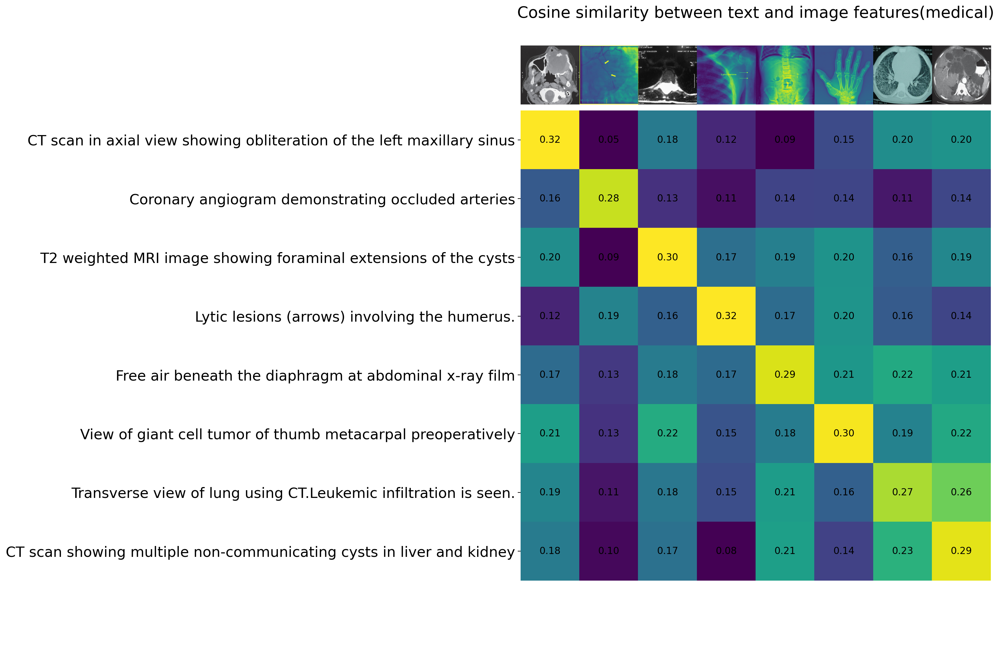

In [ ]:
#load checkpoint
model.load_state_dict(torch.load('/content/drive/My Drive/data/ViT-B-16_best_checkpoint_2.tar'))

#compute txt-img similarity again
original_images = []
images = []
texts = []
for filename in list(med_descriptions.keys()):
    image = Image.open(os.path.join(root_dir, filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[filename])
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)

# Evaluation sur les modèles de CLIP

In [ ]:
import clip
import torch
from torchvision import datasets, transforms
from sklearn.metrics import accuracy_score
import pandas as pd
import time

device = "cuda" if torch.cuda.is_available() else "cpu"
models_to_test = [
    "RN50", "RN101", "RN50x4", "RN50x16", "RN50x64",
    "ViT-B/32", "ViT-B/16", "ViT-L/14", "ViT-L/14@336px"
]
batch_size = 16

# Charger le dataset CIFAR-100
cifar100 = datasets.CIFAR100(root="./data", train=False, download=True)
dataloader = None

# Classes et descriptions textuelles (zéro-shot)
class_descriptions = [f"A photo of a {c}" for c in cifar100.classes]
print(f"Classes: {class_descriptions}")

# Résultats
results = []

for model_name in models_to_test:
    print(f"Evaluating model: {model_name}")
    model, preprocess = clip.load(model_name, device=device)
    model.eval()

    # Initialiser le dataloader avec la transformation appropriée
    transform = preprocess
    dataset = datasets.CIFAR100(root="./data", train=False, download=False, transform=transform)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=False)

    # Tokenizer pour les classes
    text_inputs = clip.tokenize(class_descriptions).to(device)

    # Variables pour stocker les performances
    all_preds = []
    all_labels = []
    start_time = time.time()

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)

            # Encode image et texte
            image_features = model.encode_image(images)
            text_features = model.encode_text(text_inputs)

            # Normaliser les features
            image_features /= image_features.norm(dim=-1, keepdim=True)
            text_features /= text_features.norm(dim=-1, keepdim=True)

            # Calcul des similarités et des prédictions
            similarity = image_features @ text_features.T
            preds = similarity.argmax(dim=-1).cpu().numpy()

            all_preds.extend(preds)
            all_labels.extend(labels.numpy())

    # Calcul des métriques
    accuracy = accuracy_score(all_labels, all_preds)
    inference_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated(device=device) / (1024 ** 3)  # Mémoire en Go

    results.append({
        "model": model_name,
        "accuracy": accuracy,
        "inference_time": inference_time,
        "memory_usage": memory_usage,
    })

    print(f"Model: {model_name}, Accuracy: {accuracy:.4f}, Time: {inference_time:.2f}s, Memory: {memory_usage:.2f}GB")

results_df = pd.DataFrame(results)
print(results_df)
results_df.to_csv("clip_model_cifar100_comparison.csv", index=False)


Files already downloaded and verified
Classes: ['A photo of a apple', 'A photo of a aquarium_fish', 'A photo of a baby', 'A photo of a bear', 'A photo of a beaver', 'A photo of a bed', 'A photo of a bee', 'A photo of a beetle', 'A photo of a bicycle', 'A photo of a bottle', 'A photo of a bowl', 'A photo of a boy', 'A photo of a bridge', 'A photo of a bus', 'A photo of a butterfly', 'A photo of a camel', 'A photo of a can', 'A photo of a castle', 'A photo of a caterpillar', 'A photo of a cattle', 'A photo of a chair', 'A photo of a chimpanzee', 'A photo of a clock', 'A photo of a cloud', 'A photo of a cockroach', 'A photo of a couch', 'A photo of a crab', 'A photo of a crocodile', 'A photo of a cup', 'A photo of a dinosaur', 'A photo of a dolphin', 'A photo of a elephant', 'A photo of a flatfish', 'A photo of a forest', 'A photo of a fox', 'A photo of a girl', 'A photo of a hamster', 'A photo of a house', 'A photo of a kangaroo', 'A photo of a keyboard', 'A photo of a lamp', 'A photo of

100%|███████████████████████████████████████| 630M/630M [05:59<00:00, 1.84MiB/s]


Model: RN50x16, Accuracy: 0.4612, Time: 275.40s, Memory: 5.64GB
Evaluating model: RN50x64


100%|█████████████████████████████████████| 1.26G/1.26G [01:43<00:00, 13.1MiB/s]


Model: RN50x64, Accuracy: 0.5210, Time: 594.42s, Memory: 5.72GB
Evaluating model: ViT-B/32


100%|███████████████████████████████████████| 338M/338M [00:06<00:00, 52.4MiB/s]


Model: ViT-B/32, Accuracy: 0.6172, Time: 78.90s, Memory: 5.72GB
Evaluating model: ViT-B/16
Model: ViT-B/16, Accuracy: 0.6471, Time: 96.62s, Memory: 5.72GB
Evaluating model: ViT-L/14


100%|████████████████████████████████████████| 890M/890M [00:08<00:00, 104MiB/s]


Model: ViT-L/14, Accuracy: 0.7325, Time: 225.51s, Memory: 5.72GB
Evaluating model: ViT-L/14@336px


100%|███████████████████████████████████████| 891M/891M [00:15<00:00, 59.0MiB/s]


Model: ViT-L/14@336px, Accuracy: 0.7204, Time: 414.71s, Memory: 5.72GB
            model  accuracy  inference_time  memory_usage
0            RN50    0.3895       80.732237      5.641888
1           RN101    0.4146       92.487225      5.641888
2          RN50x4    0.3695      145.483667      5.641888
3         RN50x16    0.4612      275.402452      5.641888
4         RN50x64    0.5210      594.424261      5.721196
5        ViT-B/32    0.6172       78.902127      5.721196
6        ViT-B/16    0.6471       96.621681      5.721196
7        ViT-L/14    0.7325      225.512515      5.721196
8  ViT-L/14@336px    0.7204      414.708405      5.721196


# CLIP dans le domaine médical sur d’autres exemples du jeu de données

Loaded 6 images successfully.


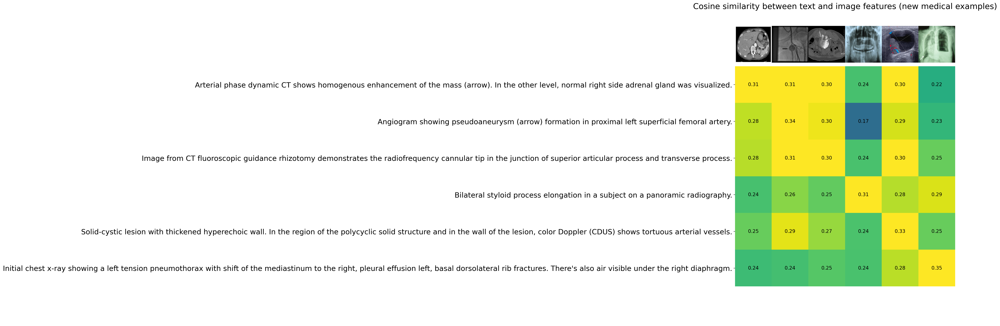

In [ ]:
new_med_descriptions = {
    "ROCO_00206": "Arterial phase dynamic CT shows homogenous enhancement of the mass (arrow). In the other level, normal right side adrenal gland was visualized.",
    "ROCO_00218": "Angiogram showing pseudoaneurysm (arrow) formation in proximal left superficial femoral artery.",
    "ROCO_00251": "Image from CT fluoroscopic guidance rhizotomy demonstrates the radiofrequency cannular tip in the junction of superior articular process and transverse process.",
    "ROCO_00258": "Bilateral styloid process elongation in a subject on a panoramic radiography.",
    "ROCO_00261": "Solid-cystic lesion with thickened hyperechoic wall. In the region of the polycyclic solid structure and in the wall of the lesion, color Doppler (CDUS) shows tortuous arterial vessels.",
    "ROCO_00264": "Initial chest x-ray showing a left tension pneumothorax with shift of the mediastinum to the right, pleural effusion left, basal dorsolateral rib fractures. There's also air visible under the right diaphragm."
}

root_dir = "/content/drive/My Drive/data/pretrain_data/roco/test/radiology/images"

new_original_images = []
new_images = []
new_texts = []

for filename, description in new_med_descriptions.items():
    image_path = os.path.join(root_dir, filename + ".jpg")

    if not os.path.exists(image_path):
        print(f"File not found: {image_path}")
        continue

    image = Image.open(image_path).convert("RGB")
    new_original_images.append(image)
    new_images.append(preprocess(image))
    new_texts.append(description)

print(f"Loaded {len(new_images)} images successfully.")


# Calculer les similarités entre images et textes pour les nouveaux exemples
new_image_input = torch.tensor(np.stack(new_images)).cuda()
new_text_tokens = clip.tokenize(["This is " + desc for desc in new_texts]).cuda()

with torch.no_grad():
    new_image_features = model.encode_image(new_image_input).float()
    new_text_features = model.encode_text(new_text_tokens).float()

new_image_features /= new_image_features.norm(dim=-1, keepdim=True)
new_text_features /= new_text_features.norm(dim=-1, keepdim=True)
new_similarity = new_text_features.cpu().numpy() @ new_image_features.cpu().numpy().T

plt.figure(figsize=(20, 14))
plt.imshow(new_similarity, vmin=0.1, vmax=0.3)
plt.yticks(range(len(new_texts)), new_texts, fontsize=18)
plt.xticks([])

for i, image in enumerate(new_original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(new_similarity.shape[1]):
    for y in range(new_similarity.shape[0]):
        plt.text(x, y, f"{new_similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
    plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, len(new_texts) - 0.5])
plt.ylim([len(new_texts) + 0.5, -2])
plt.title("Cosine similarity between text and image features (new medical examples)", size=20)
plt.show()


# Performances de CLIP sur une tâche de classification d’images naturelles, sur un autre jeu de données que CIFAR100


In [ ]:
from torchvision.datasets import OxfordIIITPet
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
import clip
import torch
from torch.utils.data import DataLoader

# Charger le modèle CLIP
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# Prétraitement compatible avec CLIP
transform = Compose([
    Resize((224, 224)),
    ToTensor(),
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711)),
])

# Charger le dataset Oxford Pets
data_dir = "./oxford_pets"
pets_dataset = OxfordIIITPet(root=data_dir, download=True, transform=transform)

#DataLoader
dataloader = DataLoader(pets_dataset, batch_size=32, shuffle=False)
print(f"Nombre d'exemples : {len(pets_dataset)}")


100%|██████████| 792M/792M [00:57<00:00, 13.7MB/s]


Extracting oxford_pets/oxford-iiit-pet/images.tar.gz to oxford_pets/oxford-iiit-pet


100%|██████████| 19.2M/19.2M [00:03<00:00, 6.14MB/s]


Extracting oxford_pets/oxford-iiit-pet/annotations.tar.gz to oxford_pets/oxford-iiit-pet
Nombre d'exemples : 3680


In [ ]:
# Extraire les classes du dataset
classes = pets_dataset.classes
print(f"Classes disponibles ({len(classes)}) : {classes}")

# Générer des descriptions textuelles
text_descriptions = [f"This is a photo of a {label}" for label in classes]
text_tokens = clip.tokenize(text_descriptions).to(device)

# Encoder les descriptions textuelles avec CLIP
with torch.no_grad():
    text_features = model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)  # Normalisation


Classes disponibles (37) : ['Abyssinian', 'American Bulldog', 'American Pit Bull Terrier', 'Basset Hound', 'Beagle', 'Bengal', 'Birman', 'Bombay', 'Boxer', 'British Shorthair', 'Chihuahua', 'Egyptian Mau', 'English Cocker Spaniel', 'English Setter', 'German Shorthaired', 'Great Pyrenees', 'Havanese', 'Japanese Chin', 'Keeshond', 'Leonberger', 'Maine Coon', 'Miniature Pinscher', 'Newfoundland', 'Persian', 'Pomeranian', 'Pug', 'Ragdoll', 'Russian Blue', 'Saint Bernard', 'Samoyed', 'Scottish Terrier', 'Shiba Inu', 'Siamese', 'Sphynx', 'Staffordshire Bull Terrier', 'Wheaten Terrier', 'Yorkshire Terrier']


In [ ]:
from sklearn.metrics import accuracy_score

all_predictions = []
all_labels = []

for images, labels in dataloader:
    images = images.to(device)
    labels = labels.numpy()
    with torch.no_grad():
        image_features = model.encode_image(images)
        image_features /= image_features.norm(dim=-1, keepdim=True)  # Normalisation

        # Calculer les similarités cosinus
        similarities = (100.0 * image_features @ text_features.T).softmax(dim=-1)

        # Prédire les classes
        predictions = similarities.argmax(dim=-1).cpu().numpy()
        all_predictions.extend(predictions)
        all_labels.extend(labels)

# Calculer l'exactitude
accuracy = accuracy_score(all_labels, all_predictions)
print(f"Accuracy sur Oxford-IIIT Pets : {accuracy:.2%}")


Accuracy sur Oxford-IIIT Pets : 78.61%


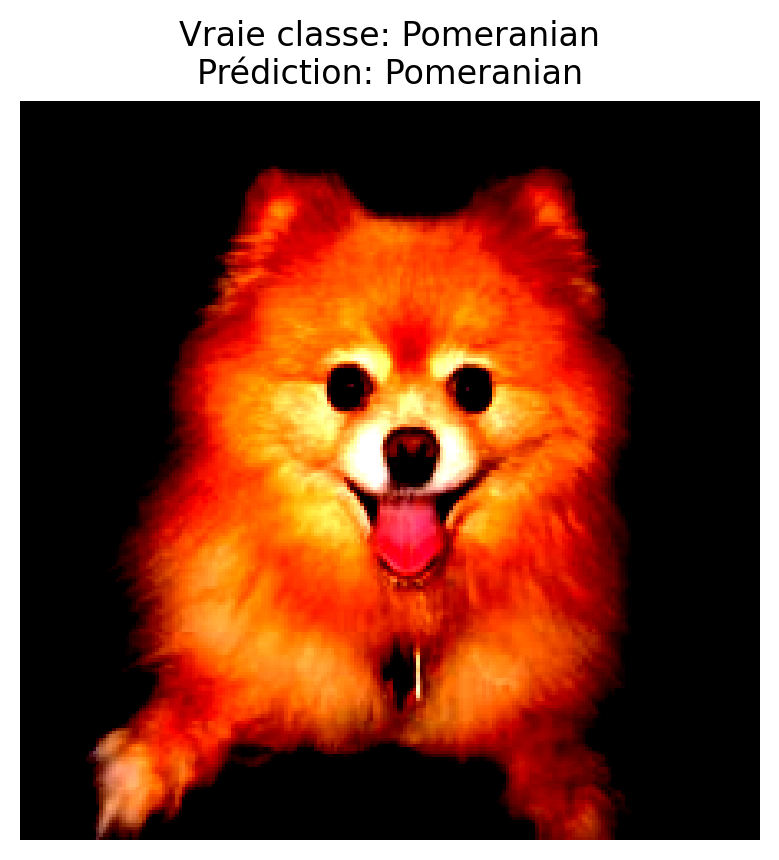

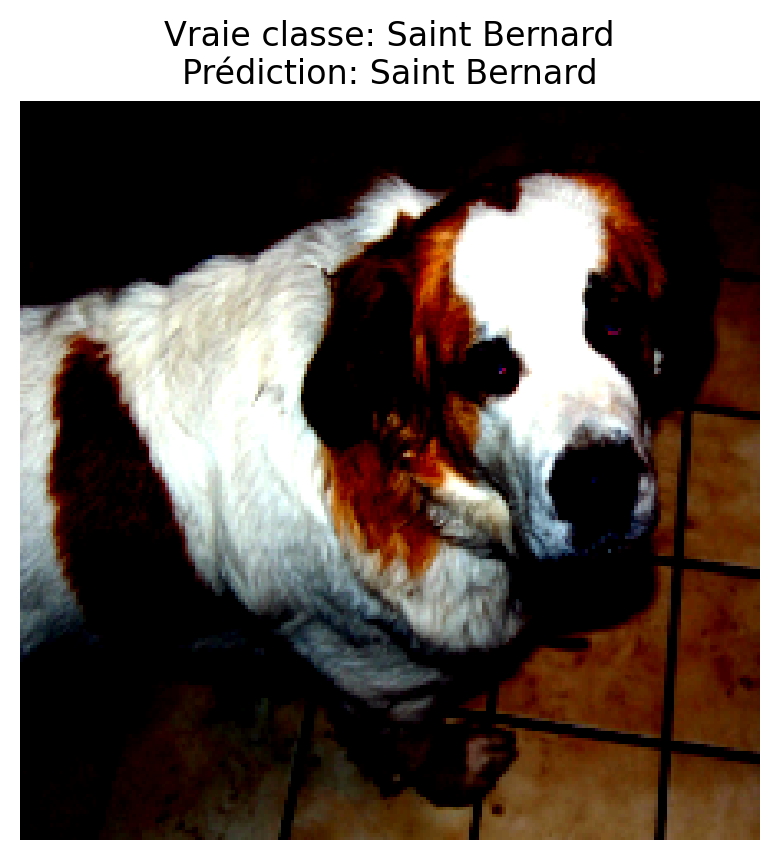

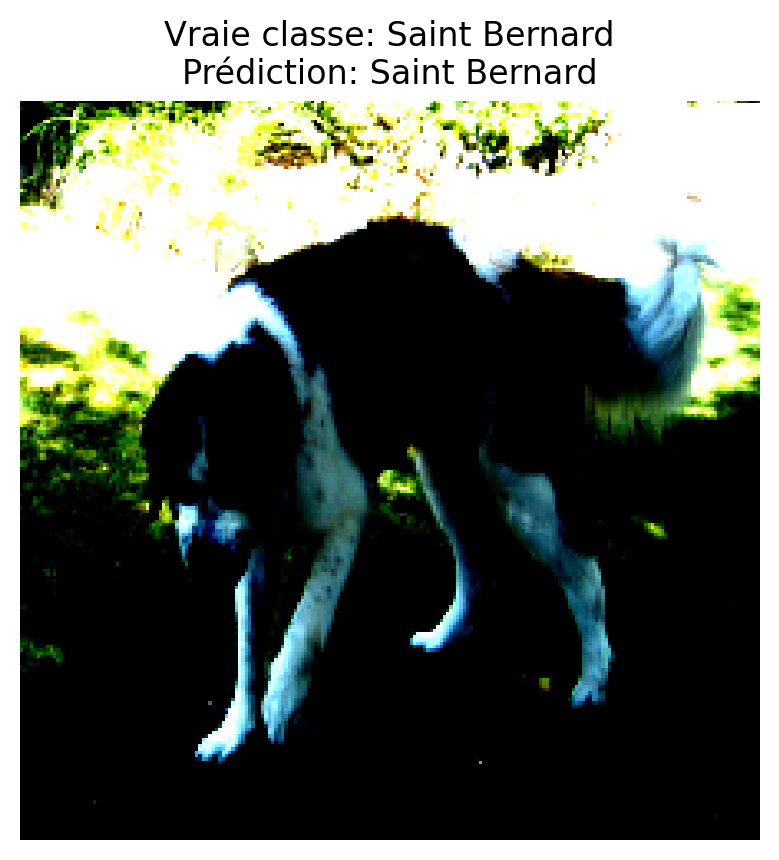

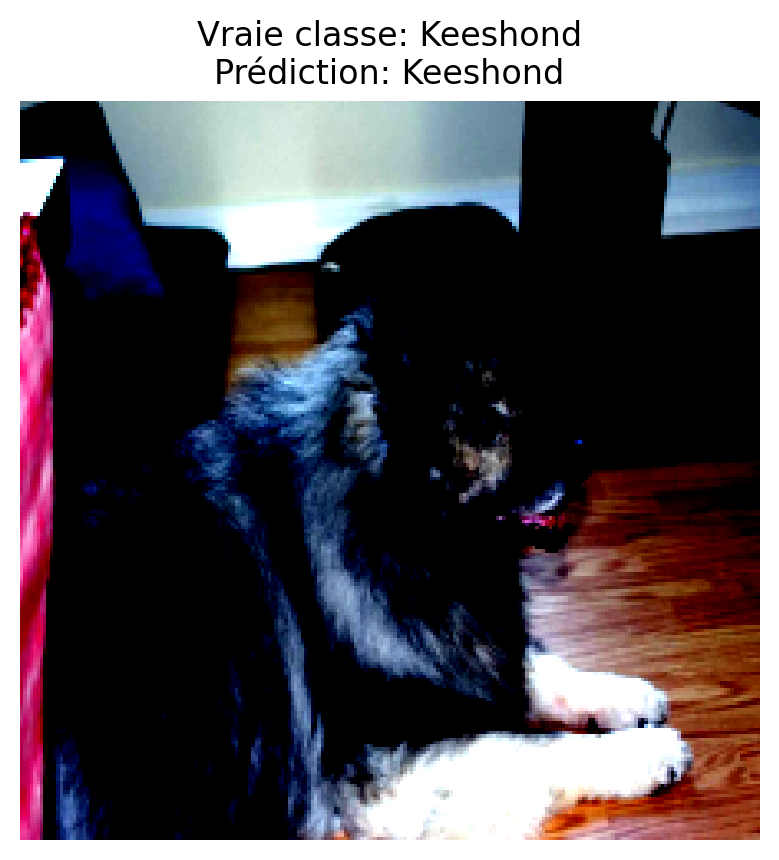

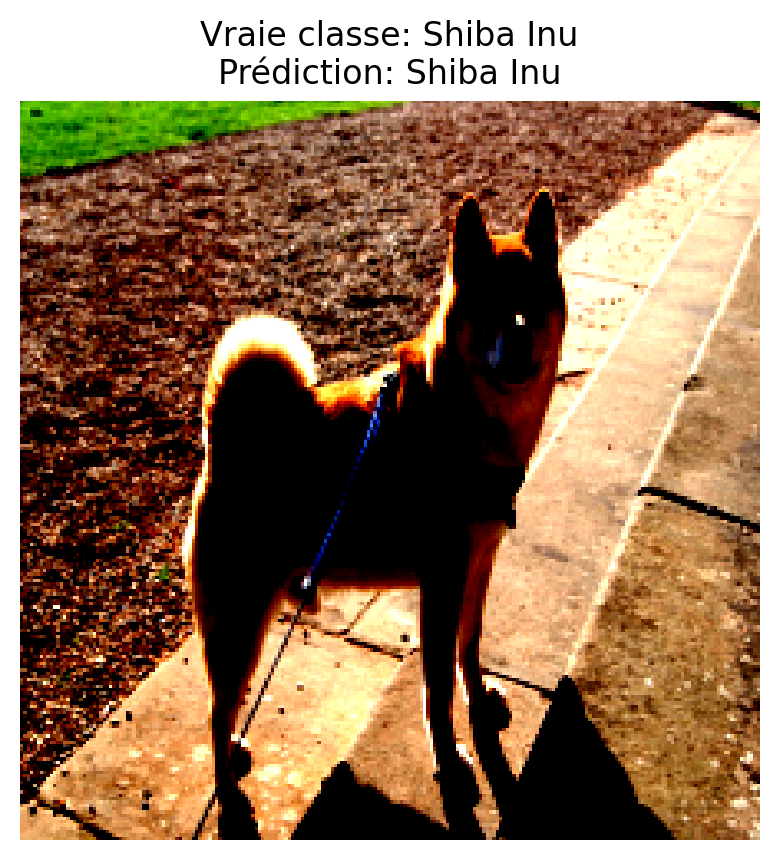

...

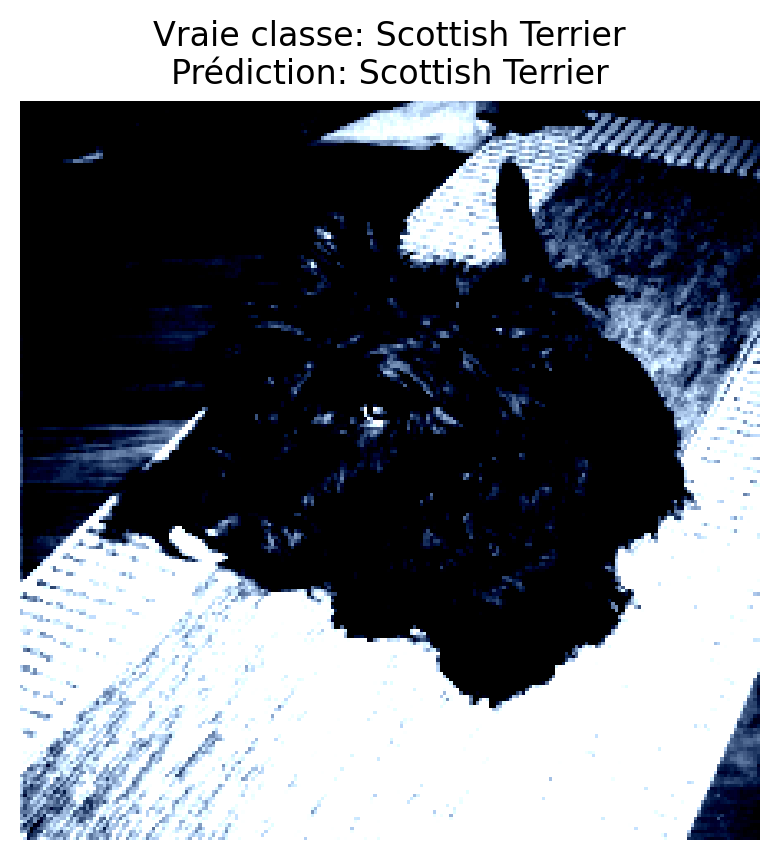

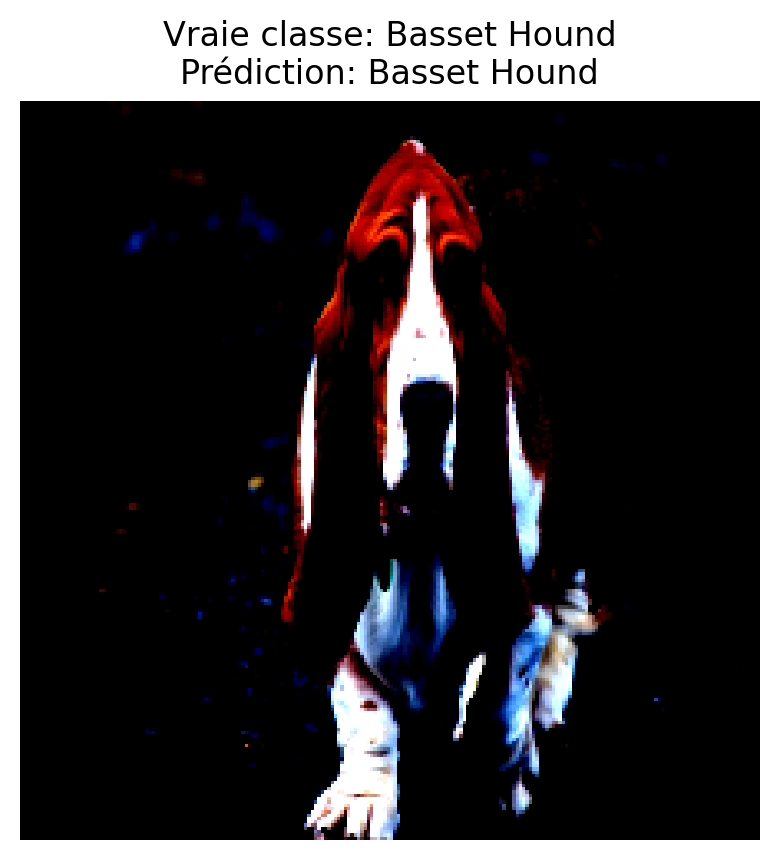

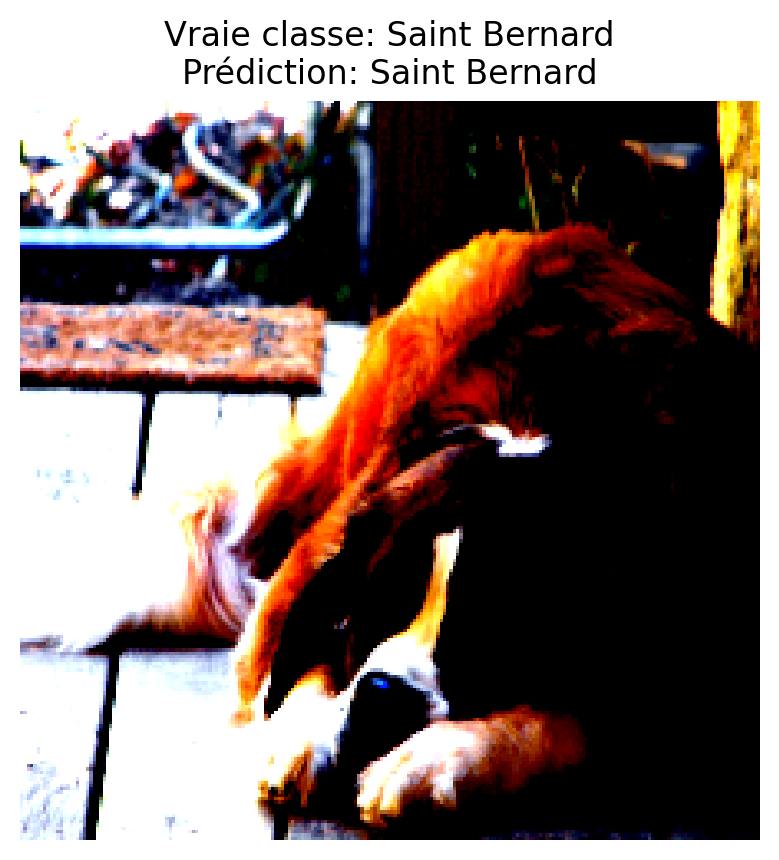

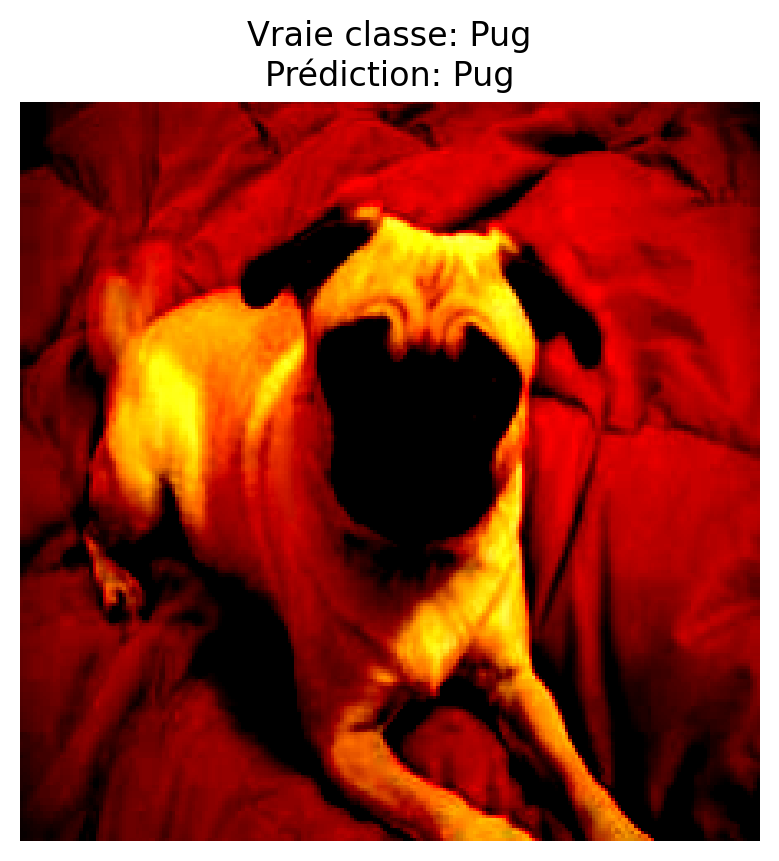

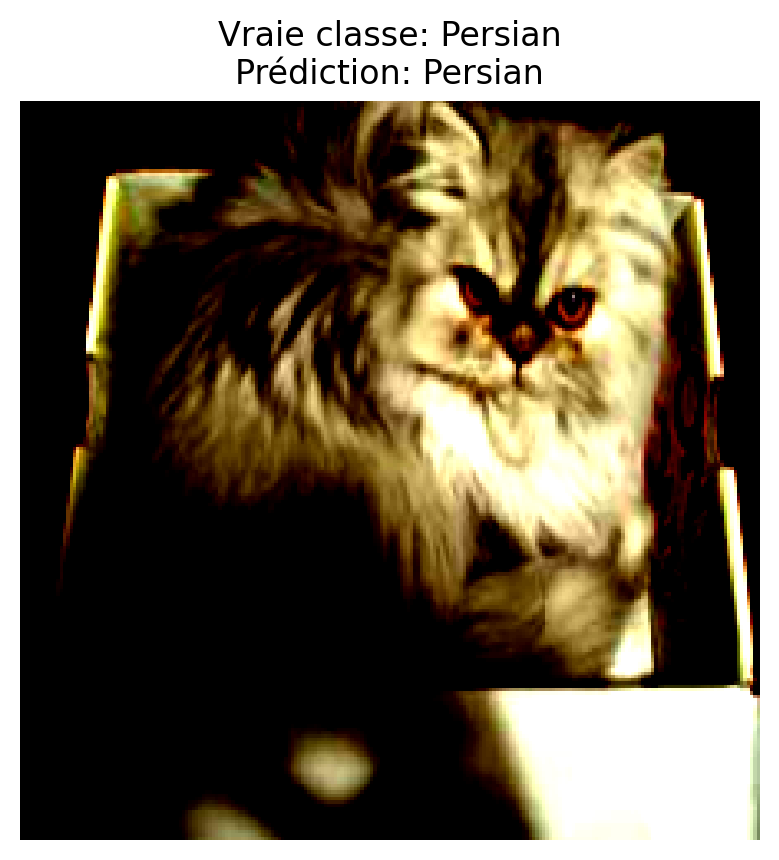

In [ ]:
import random
import matplotlib.pyplot as plt

# Choisir 20 indices aléatoires dans le dataset
random_indices = random.sample(range(len(pets_dataset)), 20)
for idx in random_indices:
    image, label = pets_dataset[idx]
    plt.imshow(image.permute(1, 2, 0))
    plt.title(f"Vraie classe: {classes[label]}\nPrédiction: {classes[all_predictions[idx]]}")
    plt.axis("off")
    plt.show()

